In [75]:
import os
import copy

In [76]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.cm
import matplotlib.gridspec as gridspec
import cv2
import pandas as pd
from pylab import imread
from skimage.color import rgb2gray
import tensorflow as tf

In [77]:
def get_subfiles(dir, ExtensionList = []):
    "Get a list of immediate subfiles"
    all_names = next(os.walk(dir))[2]
    result_names = []
    if(len(ExtensionList) > 0):
      for filename in all_names:
        fname, fextension = os.path.splitext(filename)
        if any(ext in fextension for ext in ExtensionList):
          result_names.append(dir + "/" + filename)
    else:
      result_names = [dir + "/" + x for x in all_names]
    
    print(f"There are {len(result_names)} files are found")
    print("Here is some samples :")
    [print(x) for x in result_names[0: min(len(result_names), 5)]]
    return result_names

In [78]:
os.listdir('Coconuts')

['Dừa nứt 2', 'Dừa tốt 1', 'Màu NG 3']

In [79]:
good_samples = get_subfiles('Coconuts/Dừa tốt 1', ['.jpg'])

There are 28 files are found
Here is some samples :
Coconuts/Dừa tốt 1/013ccf3e638595dbcc9454.jpg
Coconuts/Dừa tốt 1/0551eedbd3a01afe43b17.jpg
Coconuts/Dừa tốt 1/0a4efd674d0b8455dd1a42.jpg
Coconuts/Dừa tốt 1/15b2f239cf42061c5f538.jpg
Coconuts/Dừa tốt 1/20eb34a074e0bcbee5f165.jpg


In [80]:
not_good_a_samples = get_subfiles('Coconuts/Dừa nứt 2', ['.jpg'])

There are 10 files are found
Here is some samples :
Coconuts/Dừa nứt 2/0b92541d2b66e238bb7717.jpg
Coconuts/Dừa nứt 2/30b29e37e14c2812715d13.jpg
Coconuts/Dừa nứt 2/494d28ca57b19eefc7a014.jpg
Coconuts/Dừa nứt 2/57c8bb65c41e0d40540f21.jpg
Coconuts/Dừa nứt 2/5b4a91e5ee9e27c07e8f22.jpg


In [81]:
not_good_b_samples = get_subfiles('Coconuts/Màu NG 3', ['.jpg'])

There are 39 files are found
Here is some samples :
Coconuts/Màu NG 3/02e8f51d635eab00f24f107.jpg
Coconuts/Màu NG 3/08ae2275b4367c682527114.jpg
Coconuts/Màu NG 3/10af5e0a2171e82fb16019.jpg
Coconuts/Màu NG 3/15b039257a65b23beb743.jpg
Coconuts/Màu NG 3/1990b57d233eeb60b22f100.jpg


In [82]:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.10, HeightSpace = 0.10):
    from matplotlib import pyplot as plt 
    import matplotlib.gridspec as gridspec
    
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,20))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

In [83]:
def ResizeImage(image, wresize = 0, hresize = 0):
    from skimage.transform import rescale, resize
    OrigWidth, OrigHeight = float(image.shape[1]), float(image.shape[0])

    if((wresize == 0) & (hresize == 0)):
        return image
    if(wresize == 0):
        wresize = int((OrigWidth * hresize)/OrigHeight)
    if(hresize == 0):
        hresize = int((OrigHeight * wresize)/OrigWidth)
    resize_image = cv2.resize(image, (wresize, hresize), interpolation = cv2.INTER_NEAREST) 
    return resize_image

In [84]:
def ShowHistogram(image, Title = "Color Histogram", ChannelList = ["Channel 1", "Channel 2", "Channel 3"]):
  import matplotlib.pyplot as plt
  from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)

  fig, ax = plt.subplots(figsize=(20, 5))

  if(len(image.shape) == 3):
    color = ('r', 'g', 'b')
    for channel,col in enumerate(color):
        histr = cv2.calcHist([image],[channel],None,[256],[0,256])
        ax.plot(histr,color = col, label = ChannelList[channel])
        
    plt.title(Title)
    plt.legend()
  else:
    histr = cv2.calcHist([image],[0],None,[256],[0,256])
    plt.plot(histr,color = "gray", label = "Gray")
    plt.title("Gray Histogram")
    plt.legend()

  # Set axis ranges; by default this will put major ticks every 25.
  ax.set_xlim(0, 255)

  # Change major ticks to show every 20.
  ax.xaxis.set_major_locator(MultipleLocator(20))

  # Change minor ticks to show every 5. (20/4 = 5)
  ax.xaxis.set_minor_locator(AutoMinorLocator(4))

  # Turn grid on for both major and minor ticks and style minor slightly
  # differently.
  ax.grid(which='major', color='#CCCCCC', linestyle='--')
  ax.grid(which='minor', color='#CCCCCC', linestyle=':')
  plt.show()

In [85]:
def ReadImage(filepath, info_resize = (0,0), info_display = True):
  image_RGB = imread(filepath)
  image_RGB = ResizeImage(image_RGB, wresize = info_resize[0], hresize = info_resize[1])
  image_GRAY = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2GRAY)
  image_HSV = cv2.cvtColor(image_RGB, cv2.COLOR_RGB2HSV)
  ChannelList = [image_RGB, image_HSV, image_GRAY]
  print(f"{filepath} shape : {image_RGB.shape}")
  if(info_display):
    ShowImage([image_RGB, image_HSV, image_GRAY], 1, 3)
  return ChannelList

In [86]:
def ShowImageInfo(ChannelList):
  image_RGB = ChannelList[0]
  image_HSV = ChannelList[1]
  image_GRAY = ChannelList[2]
  ShowHistogram(image_RGB, "RGB Channel", ["Red Channel", "Green Channel", "Blue Channel"])
  ShowHistogram(image_HSV, "HSV Channel", ["Hue Channel", "Saturation Channel", "Value Channel"])
  ShowHistogram(image_GRAY)

Coconuts/Dừa tốt 1/013ccf3e638595dbcc9454.jpg shape : (960, 720, 3)


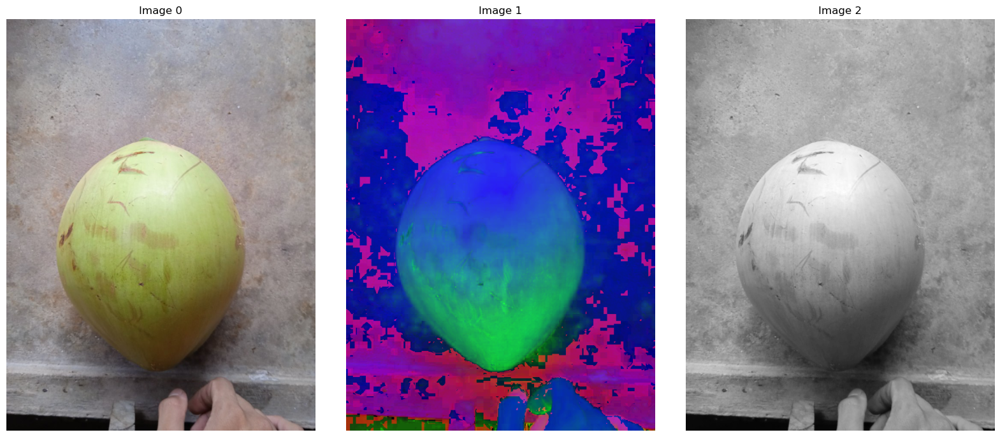

In [87]:
ChannelListG = ReadImage(good_samples[0])

Coconuts/Dừa tốt 1/013ccf3e638595dbcc9454.jpg shape : (266, 200, 3)


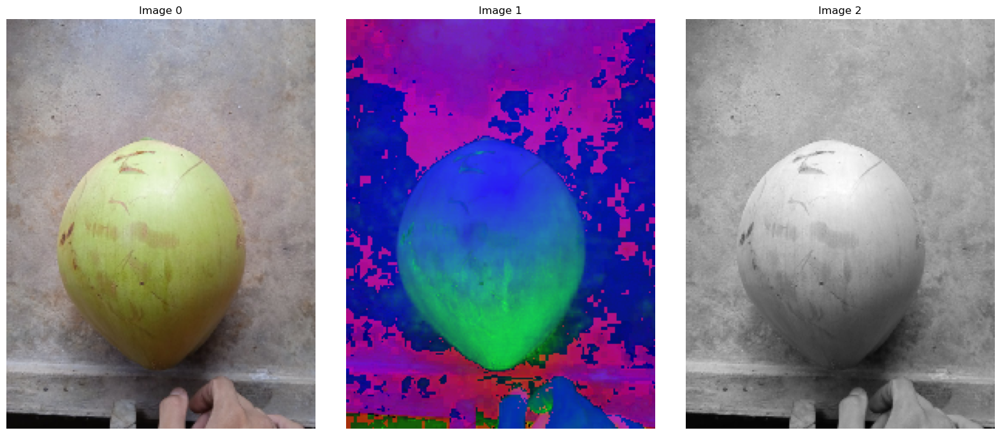

In [88]:
ChannelListG = ReadImage(good_samples[0], info_resize = (200, 0))

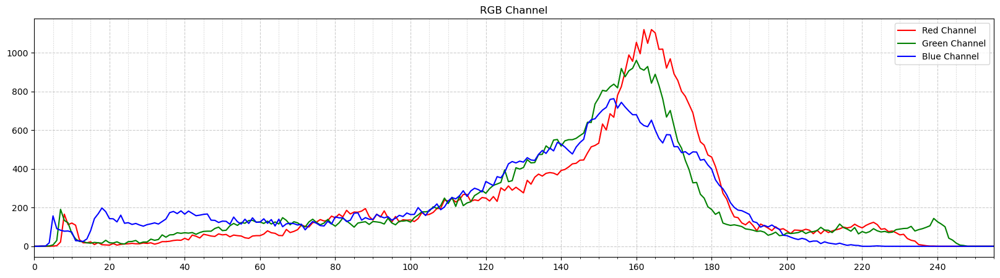

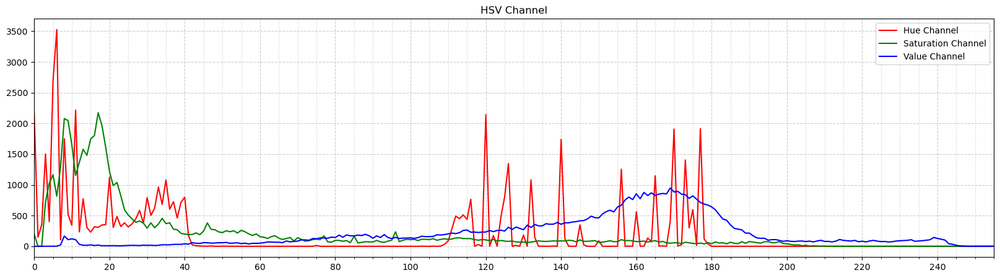

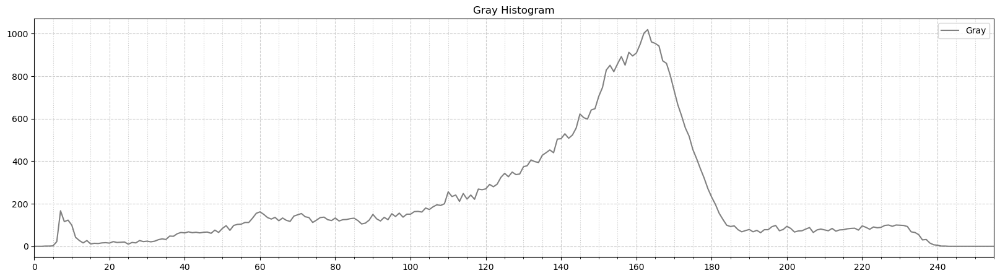

In [89]:
ShowImageInfo(ChannelListG)

Coconuts/Dừa nứt 2/0b92541d2b66e238bb7717.jpg shape : (266, 200, 3)


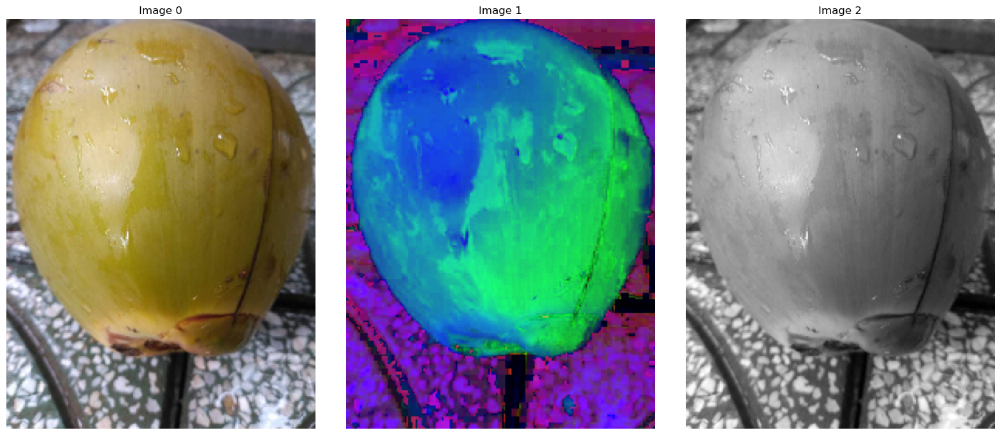

In [90]:
ChannelListNGA = ReadImage(not_good_a_samples[0], info_resize = (200, 0))

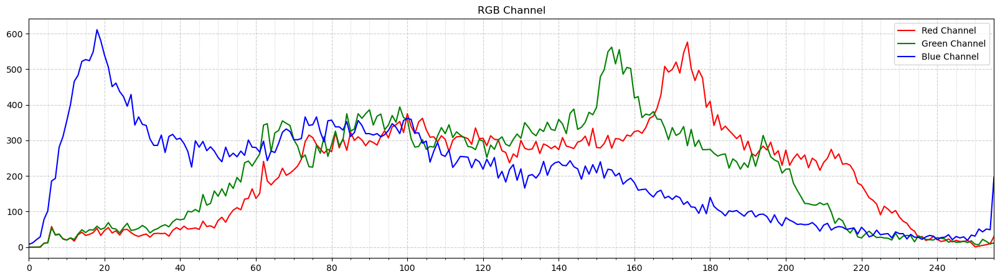

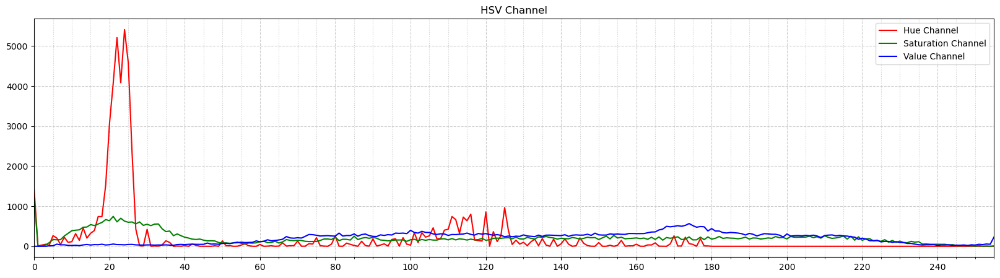

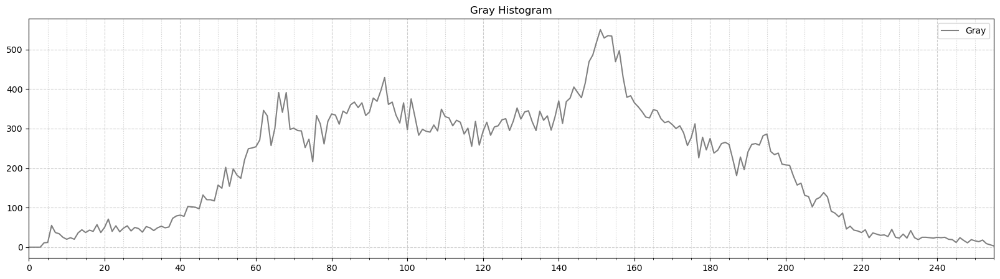

In [91]:
ShowImageInfo(ChannelListNGA)

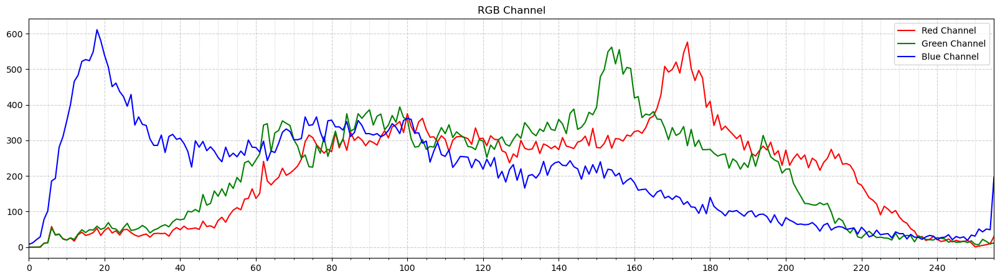

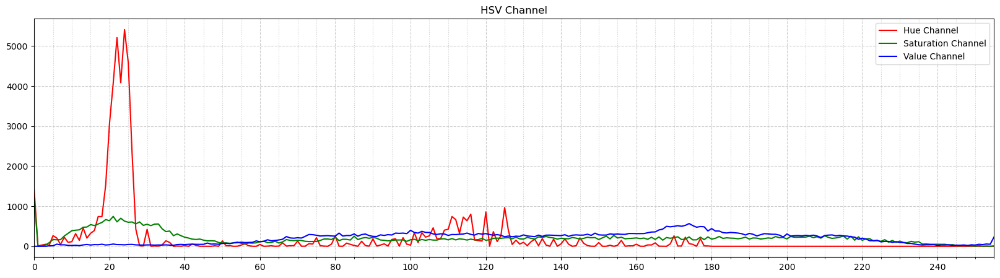

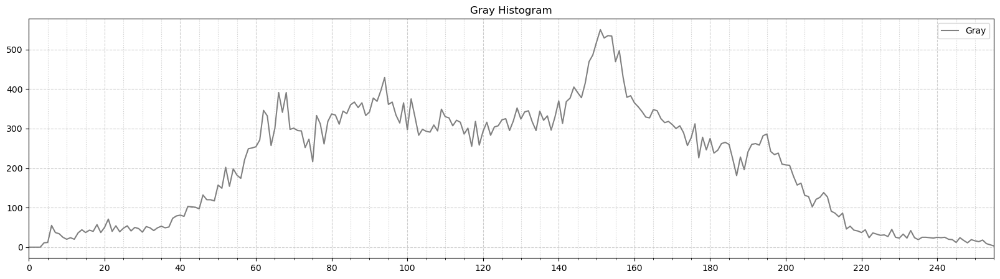

In [92]:
ShowImageInfo(ChannelListNGA)

Coconuts/Màu NG 3/02e8f51d635eab00f24f107.jpg shape : (112, 200, 3)


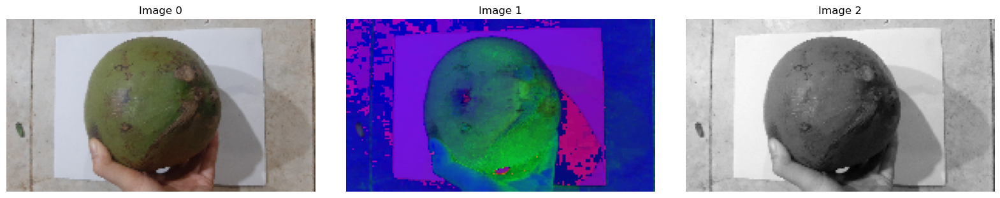

In [93]:
ChannelListNGB = ReadImage(not_good_b_samples[0], info_resize = (200, 0))

# One Image Analysis

Coconuts/Dừa tốt 1/013ccf3e638595dbcc9454.jpg shape : (400, 300, 3)


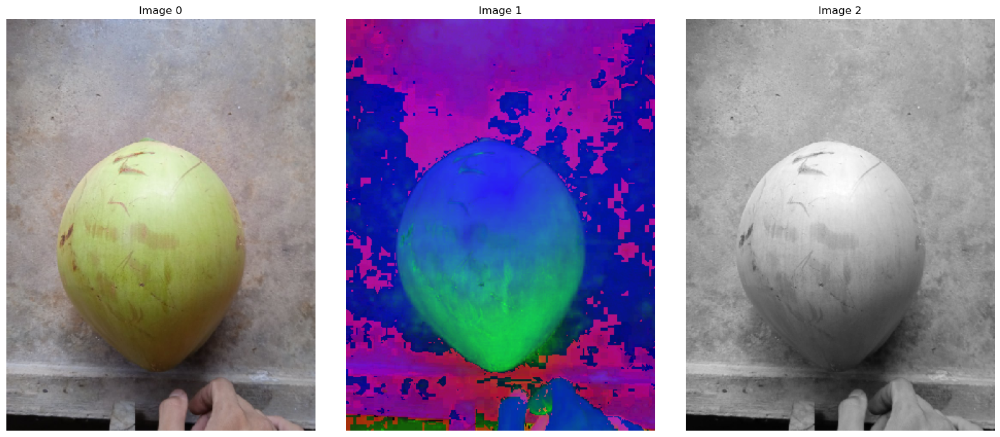

In [94]:
ChannelListG = ReadImage(good_samples[0], info_resize = (300,0))
image_RGB = ChannelListG[0]
image_HSV = ChannelListG[1]
image_GRAY = ChannelListG[2]

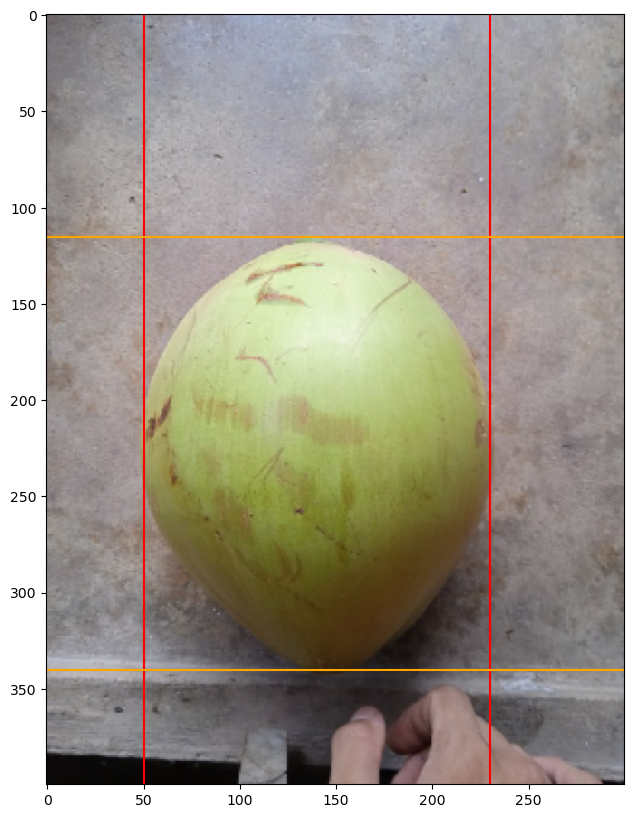

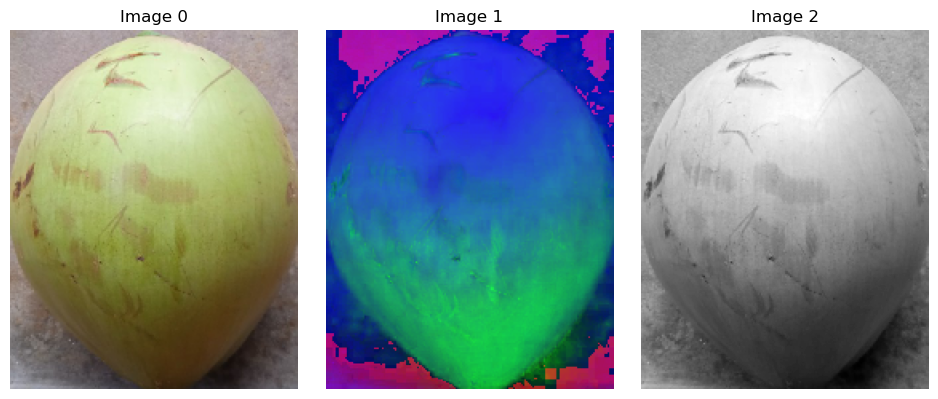

In [95]:
image = copy.deepcopy(image_RGB)
left, right = 50, 230
top, bottom = 115, 340

plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axvline(x= left, color='red')
plt.axvline(x= right, color='red')
plt.axhline(y= top, color='orange')
plt.axhline(y= bottom, color='orange')
plt.show()

image_crop_RGB = image_RGB[top:bottom, left:right]
image_crop_HSV = image_HSV[top:bottom, left:right]
image_crop_GRAY = image_GRAY[top:bottom, left:right]
ShowImage([image_crop_RGB, image_crop_HSV, image_crop_GRAY], 1, 5)

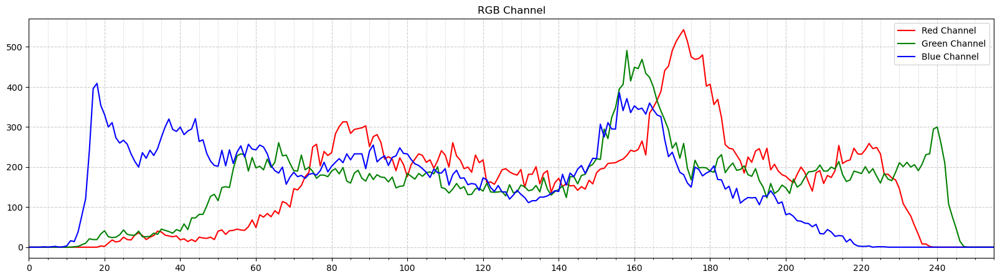

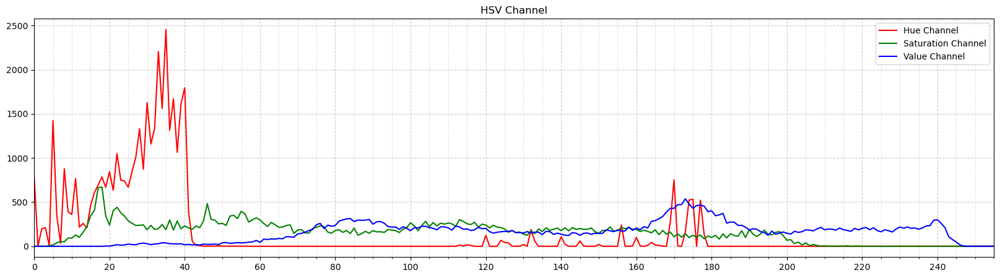

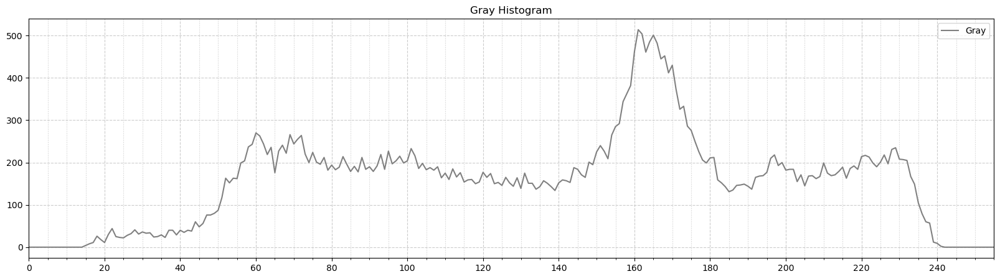

In [96]:
ShowHistogram(image_crop_RGB, "RGB Channel", ["Red Channel", "Green Channel", "Blue Channel"])
ShowHistogram(image_crop_HSV, "HSV Channel", ["Hue Channel", "Saturation Channel", "Value Channel"])
ShowHistogram(image_crop_GRAY)

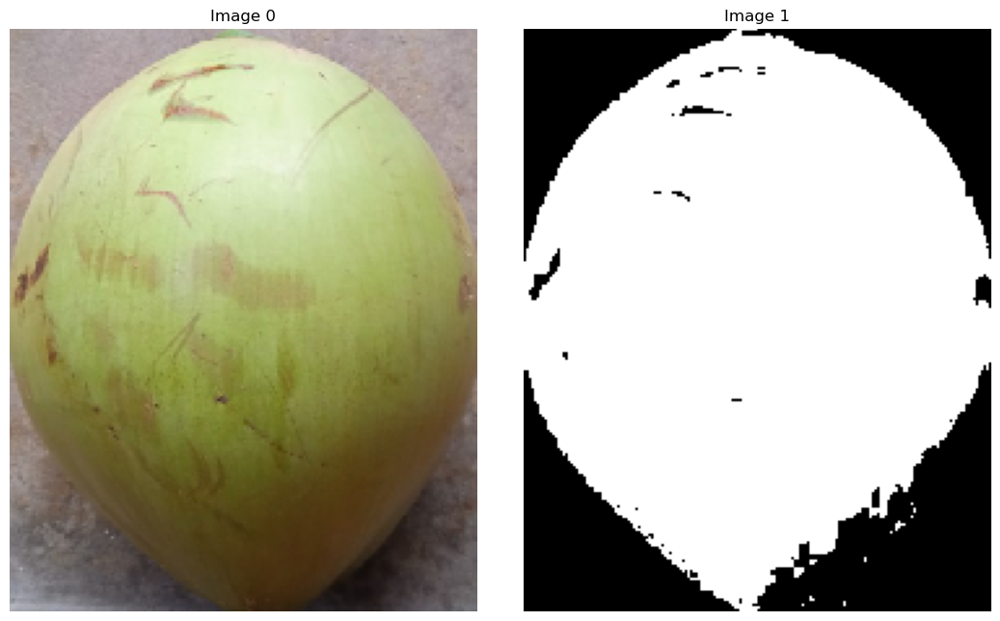

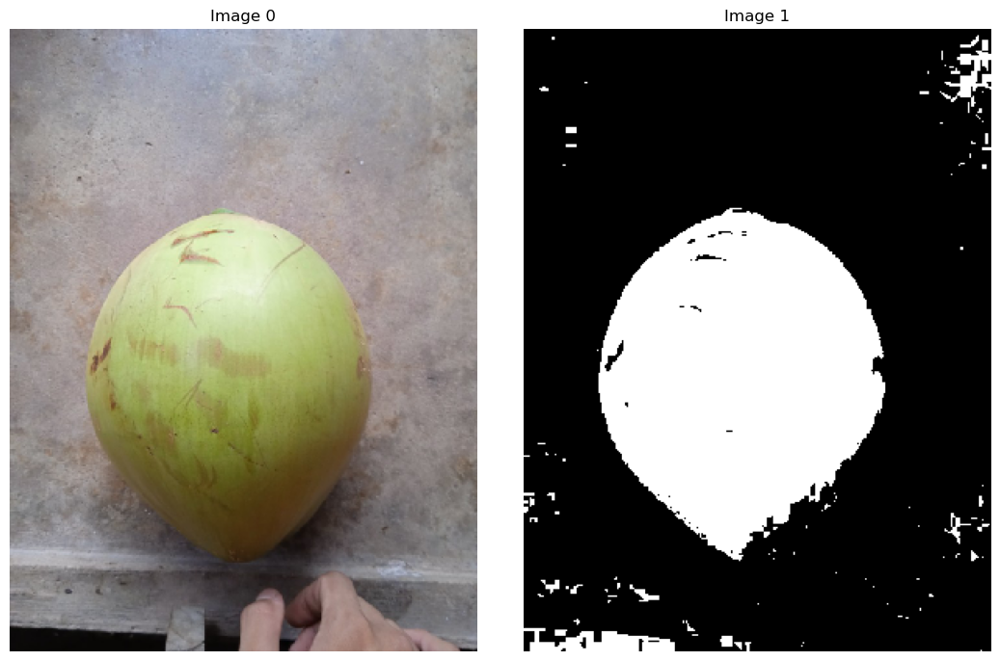

In [97]:
# lấy ngưỡng cần xác minh: độ chia nhỏ nhất (ax) là 5, Hue rõ nhất nằm trong khoảng 17-45
thresh = (17, 45)
# Lấy kênh màu H
channel = image_crop_HSV[:,:,0]
# từng điểm ảnh trả về true flase theo điều kiện
mask_crop = (channel > thresh[0]) & (channel < thresh[1]) # trả về ảnh nhị phân

channel = image_HSV[:,:,0]
mask_full = (channel > thresh[0]) & (channel < thresh[1])

ShowImage([image_crop_RGB, mask_crop], 1, 3)
ShowImage([image_RGB, mask_full], 1, 3)

In [98]:
os.listdir()

['.ipynb_checkpoints',
 'AIS_05A.ipynb',
 'AI_Specialist_Support_05A (Vision_Traditional_CVs).html',
 'AI_Specialist_Support_05B (Vision_Traditional_CVs).html',
 'Coconuts',
 'Good Coconut.jpg',
 'NG-A Coconut.jpg',
 'NG-B Coconut.jpg']

Good Coconut.jpg shape : (400, 300, 3)


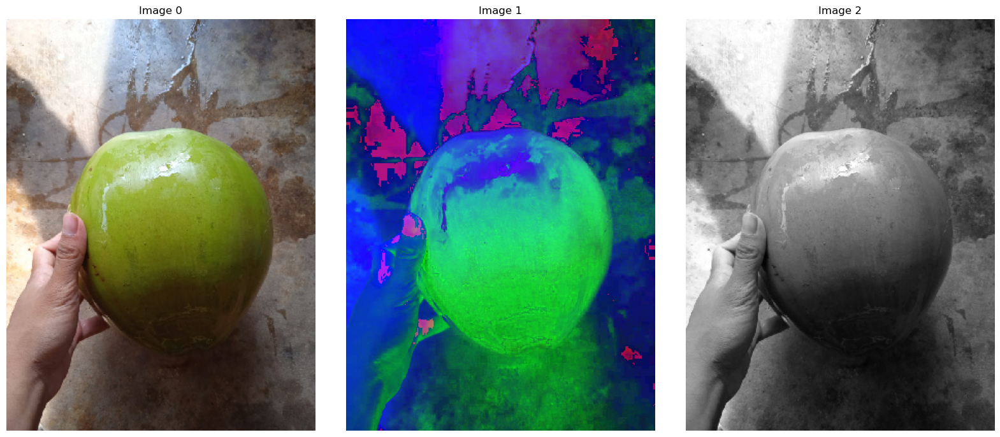

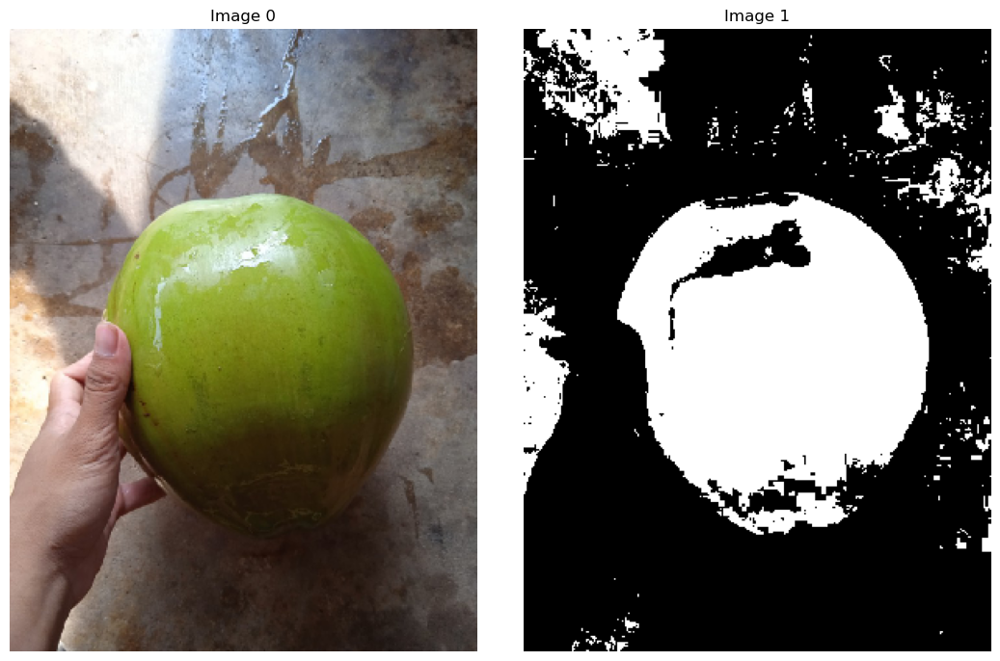

In [99]:
# áp ngưỡng với các trái dừa khác
ChannelListG_Test = ReadImage('Good Coconut.jpg', info_resize = (300, 0))
image_RGB = ChannelListG_Test[0]
image_HSV = ChannelListG_Test[1]
image_GRAY = ChannelListG_Test[2]

thresh = (15, 45)
channel = image_HSV[:,:,0]
mask_full = (channel > thresh[0]) & (channel < thresh[1])
ShowImage([image_RGB, mask_full], 1, 3)

NG-A Coconut.jpg shape : (400, 300, 3)


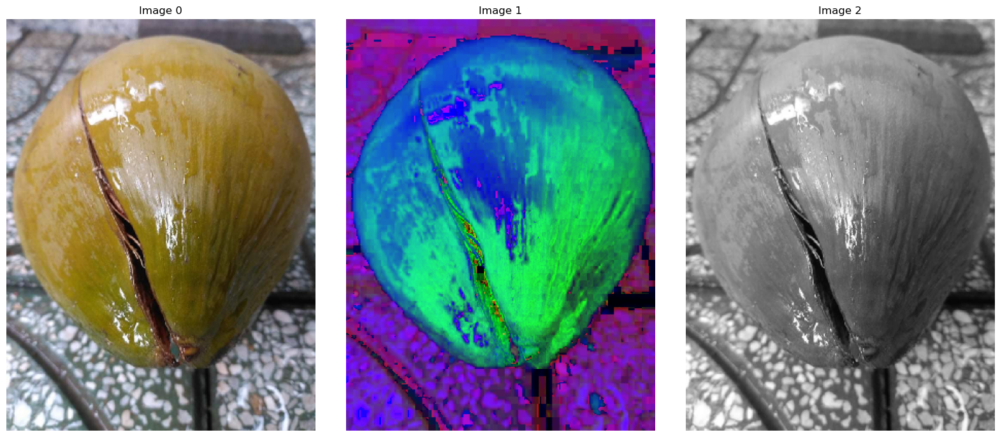

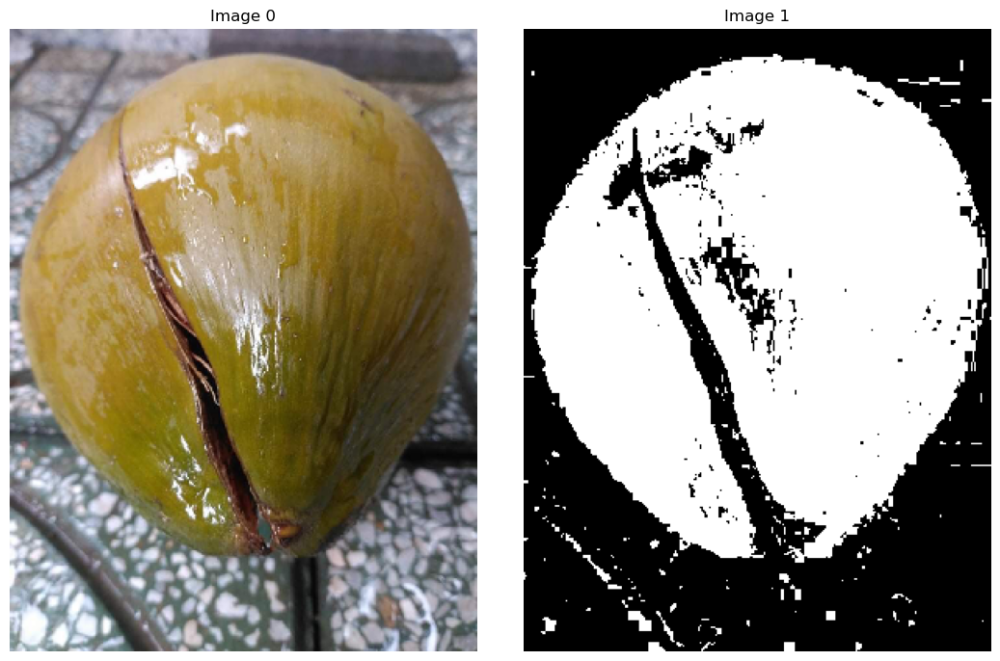

In [100]:
ChannelListG_Test = ReadImage('NG-A Coconut.jpg', info_resize = (300, 0))
image_RGB = ChannelListG_Test[0]
image_HSV = ChannelListG_Test[1]
image_GRAY = ChannelListG_Test[2]

thresh = (15, 45)
channel = image_HSV[:,:,0]
mask_full = (channel > thresh[0]) & (channel < thresh[1])
ShowImage([image_RGB, mask_full], 1, 3)

NG-B Coconut.jpg shape : (533, 300, 3)


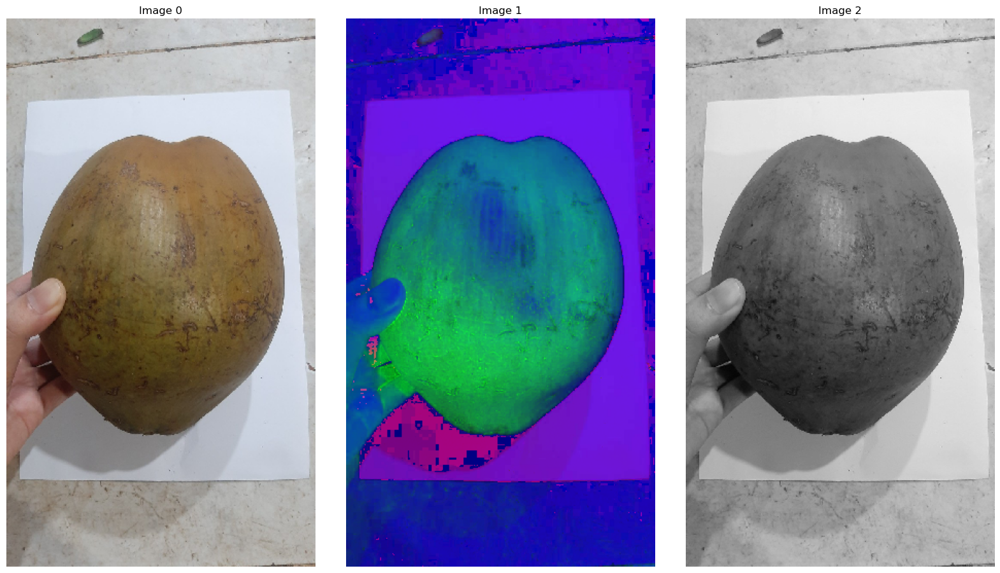

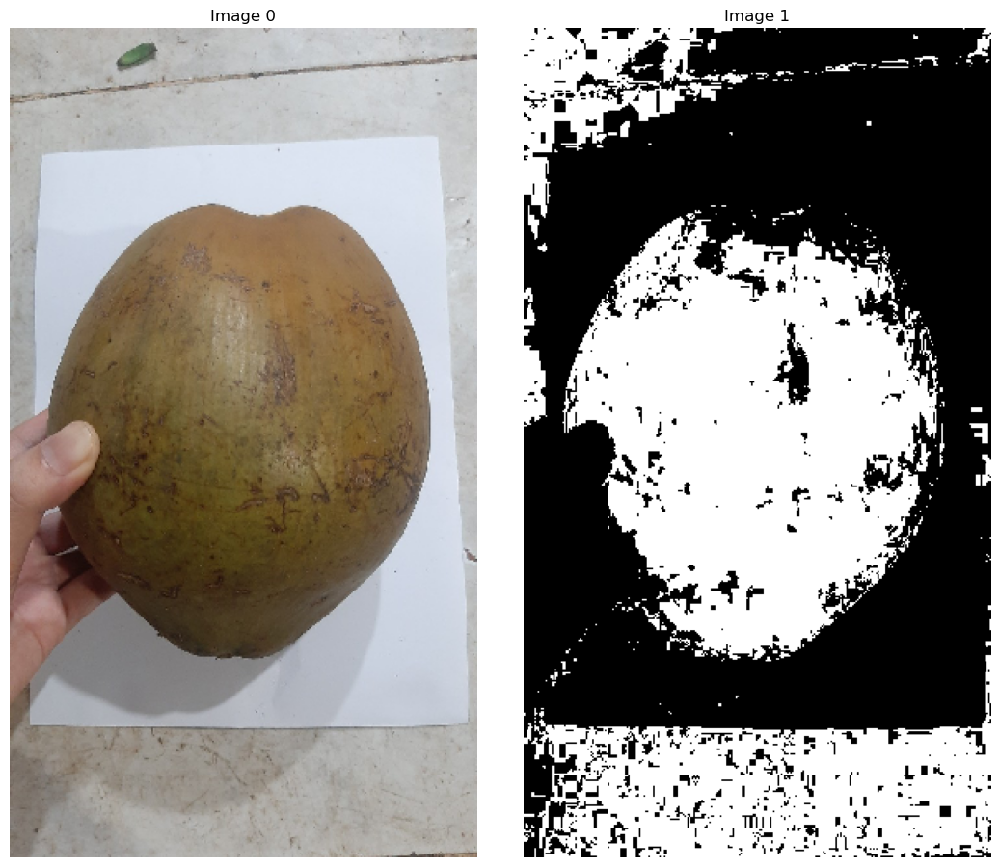

In [101]:
ChannelListG_Test = ReadImage('NG-B Coconut.jpg', info_resize = (300, 0))
image_RGB = ChannelListG_Test[0]
image_HSV = ChannelListG_Test[1]
image_GRAY = ChannelListG_Test[2]

thresh = (15, 45)
channel = image_HSV[:,:,0]
mask_full = (channel > thresh[0]) & (channel < thresh[1])
ShowImage([image_RGB, mask_full], 1, 3)

=> xác định vùng để đóng biên trái dừa là ngưỡng 15-45

# Segmentation

Good Coconut.jpg shape : (400, 300, 3)


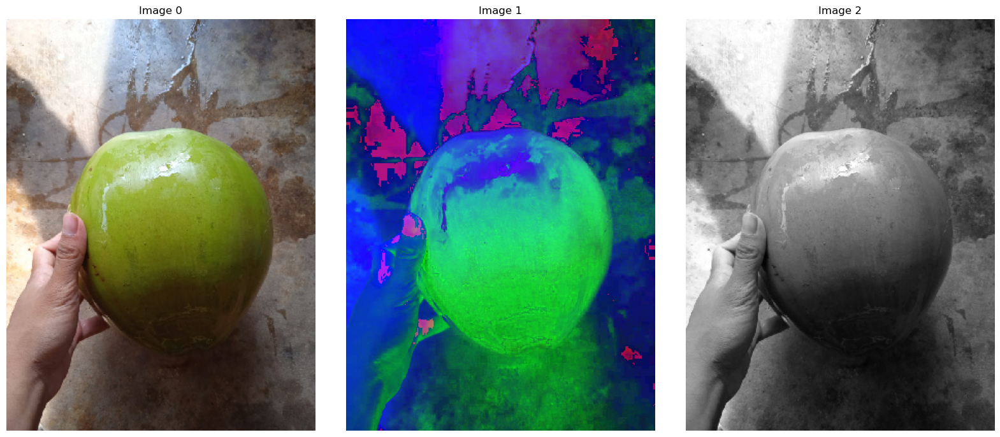

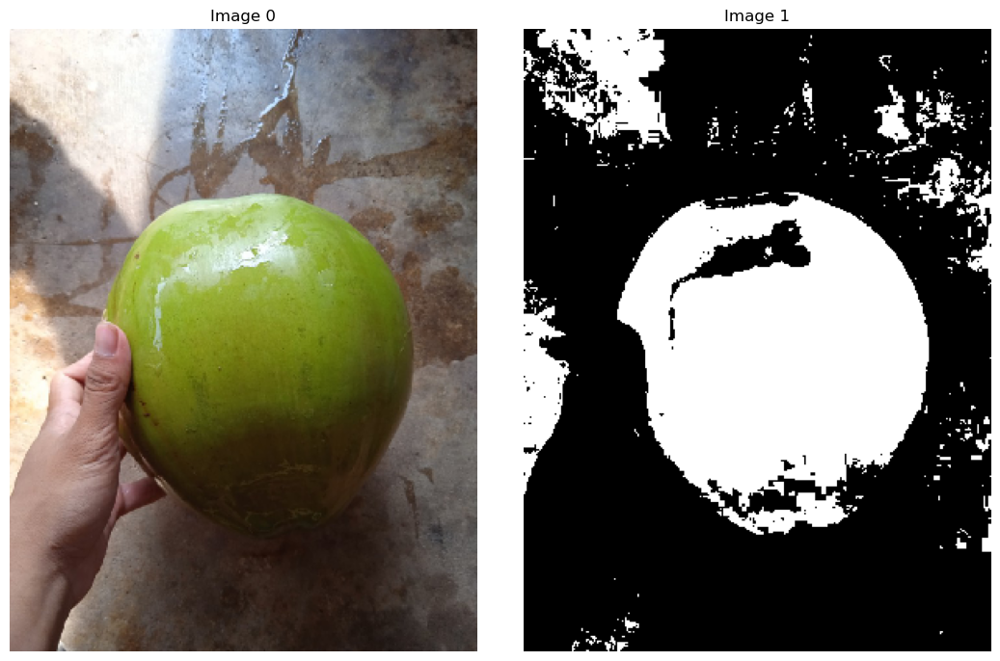

In [102]:
Object_thresh = (15, 45)
resize_info = (300, 0)
ChannelListG_Test = ReadImage('Good Coconut.jpg', info_resize = resize_info)

image_RGB, image_HSV, image_GRAY = ChannelListG_Test[0], ChannelListG_Test[1], ChannelListG_Test[2]
channel = image_HSV[:,:,0]
image_mask = (channel > thresh[0]) & (channel < thresh[1])
ShowImage([image_RGB, image_mask], 1, 3)

image_mask_org = copy.deepcopy(image_mask)

In [103]:
# đưa 1 mask và fill những chỗ màu đen
def fillholes(mask):
  from scipy import ndimage as ndi
  result = ndi.binary_fill_holes(mask)
  return result

def morphology(mask, size):
    from skimage.morphology import erosion, dilation, opening, closing, white_tophat
    from skimage.morphology import disk
    se = disk(abs(size))
    if(size > 0):
        # phóng to
        result = dilation(mask, se)
    else:
        # thu nhỏ
        result = erosion(mask, se)  
    return result

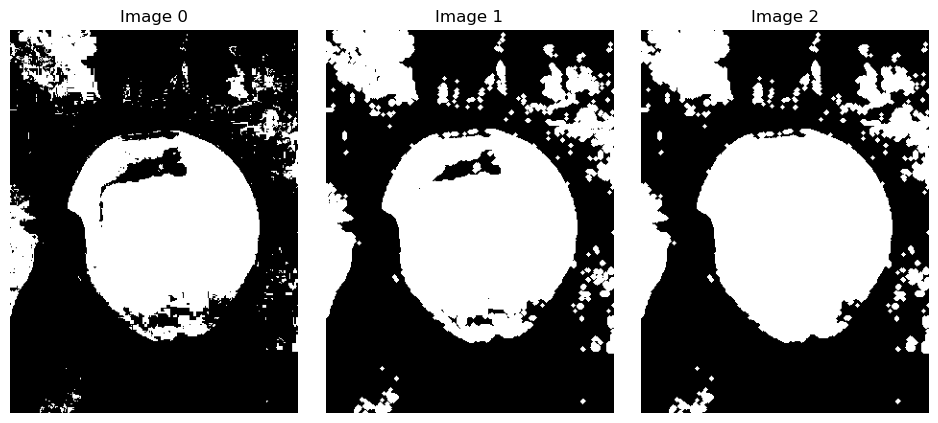

In [104]:
mask = image_mask.copy()
mask1 = morphology(mask, 2)
mask2 = fillholes(mask1)

ShowImage([mask, mask1, mask2], 1, 5)

In [105]:
def region_analysis(mask, image_value):
  from skimage.measure import label, regionprops

  image_label = label(mask) 
  print("index of each region from 1 to ", image_label.max())

  regions = regionprops(image_label, intensity_image=image_value, coordinates='rc')
  ColList = ["label", "at_row", "at_col", 
            "area", "minr", "minc", "maxr", "maxc", "width", "height", "max_intensity", "mean_intensity", "min_intensity",]

  LabelDF = pd.DataFrame(columns = ColList)
  for props in regions:
      RowList = []
      label = props.label
      if("label" in ColList):
          RowList.append(label)

      at_row, at_col = props.centroid
      if("at_row" in ColList):
          RowList.append(at_row)

      if("at_col" in ColList):
          RowList.append(at_col)

      if("area" in ColList):
          RowList.append(props.area)

      minr, minc, maxr, maxc = props.bbox
      if("minr" in ColList):
          RowList.append(minr)

      if("minc" in ColList):
          RowList.append(minc)

      if("maxr" in ColList):
          RowList.append(maxr)

      if("maxc" in ColList):
          RowList.append(maxc)

      if("width" in ColList):
          RowList.append(maxc - minc)

      if("height" in ColList):
          RowList.append(maxr - minr)

      if("max_intensity" in ColList):
          RowList.append(props.max_intensity)

      if("mean_intensity" in ColList):
          RowList.append(props.mean_intensity)

      if("min_intensity" in ColList):
          RowList.append(props.min_intensity)

      LabelDF.loc[label-1, 0 : len(RowList)] = RowList

  LabelDF = LabelDF.sort_values(by = "area", ascending = False)
  LabelDF = LabelDF.reset_index(drop = True)
  # LabelDF.head()

  return LabelDF, image_label

In [106]:
LabelDF, image_label = region_analysis(mask2, image_GRAY)
LabelDF.head()
# lấy vùng có diện tích lớn nhất => là vùng trái dừa

index of each region from 1 to  74


C:\Users\huyda\AppData\Local\Temp\ipykernel_7116\2892701247.py:7: FutureWarning: The coordinates keyword argument to skimage.measure.regionprops is deprecated. All features are now computed in rc (row-column) coordinates. Please remove `coordinates="rc"` from all calls to regionprops before updating scikit-image.
  regions = regionprops(image_label, intensity_image=image_value, coordinates='rc')
C:\Users\huyda\AppData\Local\Temp\ipykernel_7116\2892701247.py:56: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  LabelDF.loc[label-1, 0 : len(RowList)] = RowList
C:\Users\huyda\AppData\Local\Temp\ipykernel_7116\2892701247.py:56: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  LabelDF.loc[label-1, 0 : len(RowList)] = RowList
C:\Users\huyda\AppData\

,label,at_row,at_col,area,minr,minc,maxr,maxc,width,height,max_intensity,mean_intensity,min_intensity
0,38,208.694797,161.731888,33404,103,58,327,262,204,224,255.0,104.243264,13.0
1,1,34.102224,50.651184,5576,0,0,80,97,97,80,255.0,241.836083,167.0
2,47,223.481923,10.712308,2600,159,0,301,32,32,142,255.0,227.961154,106.0
3,24,111.843112,277.21216,2352,72,228,167,300,72,95,153.0,99.750425,46.0
4,7,60.294459,249.037995,1895,34,207,89,290,83,55,148.0,107.762005,62.0


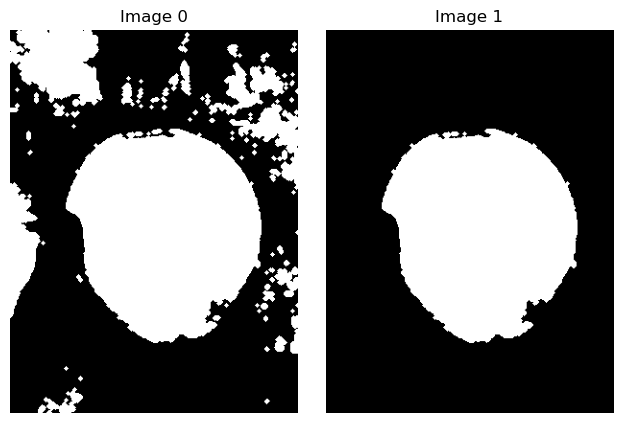

In [107]:
max_index = LabelDF.loc[0, "label"]
mask3 = image_label == max_index

ShowImage([mask2, mask3], 1, 5)
# => đã trích được đối tượng trái dừa

In [108]:
def pointsList(new_mask, n):
    gray = (new_mask*255).astype(np.uint8)
    
    thresh, im_bw = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY) 
    contours, hierarchy = cv2.findContours(im_bw, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    
    step = int(len(contours[0])/n)
    points = np.array(contours[0][0])
    
    if step == 0:
        step = 5
    for i in range (0, len(contours[0]), step):
        points = np.append((points), (contours[0][i]), axis=0)
    if len(points) > n:
        np.delete(points, 0)
        
    return points

In [111]:
def SegmentColorImageByMask(IM, Mask):
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(IM, IM, mask = Mask)
    return result

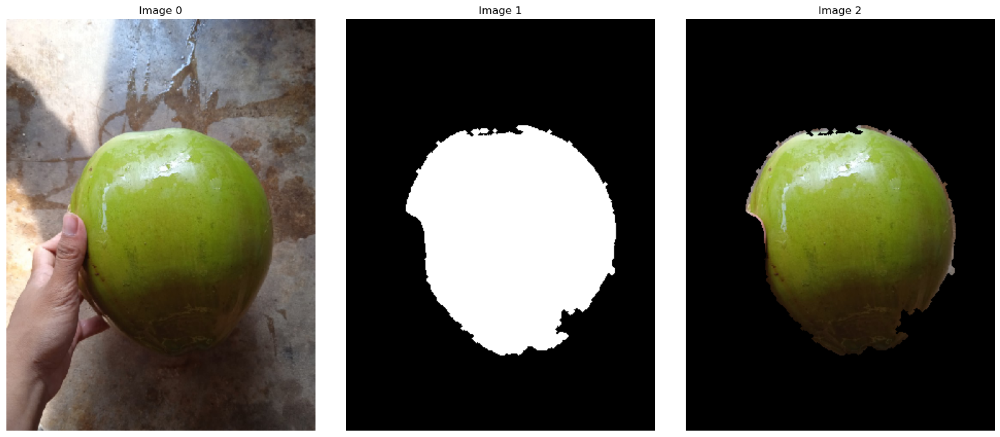

In [116]:
image_seg_RGB = copy.deepcopy(image_RGB)
image_seg_RGB = SegmentColorImageByMask(image_seg_RGB, mask3)
ShowImage([image_RGB,mask3 ,image_seg_RGB], 1, 3)

In [117]:
def GetPointsLabelling(image, image_mask, nPoints = 10):
  from skimage.measure import label, regionprops
  image_label = label(image_mask)
  XPoints = []
  YPoints = []

  for idx in range(image_label.max()):
      image_mask = image_label == (idx + 1)
      n_points_polygon = round(nPoints)
      points = pointsList(image_mask, n_points_polygon)   
      X = [i[0].item() for i in points]
      Y = [i[1].item() for i in points]
      XPoints = XPoints + X
      YPoints = YPoints + Y

  print("XPoints : ", XPoints)
  print("YPoints : ", YPoints)
  image_points = image.copy()
  cv2.polylines(image_points,[points],True,(255,0,0),thickness=2)
  
  # vẽ các điểm tròn của point
  for col_idx, row_idx in zip(XPoints, YPoints):
      cv2.drawMarker(image_points, (col_idx, row_idx),(0,0,255), markerType=cv2.MARKER_STAR, markerSize=5, thickness=2, line_type=cv2.LINE_AA)

  return image_points, XPoints, YPoints

In [119]:
# kiểm tra và chuyển bao lõm thành bao lồi
def GetConvexHullPoints(image, XPoints, YPoints):
  from scipy.spatial import ConvexHull, convex_hull_plot_2d
  points = np.column_stack((XPoints, YPoints))
  hull = ConvexHull(points)
  
  PointSet = set([])
  for simplex in hull.simplices:
    PointSet.update(set(simplex))
  convex_points = points[list(PointSet)]

  NewXPoints = list(convex_points[:, 0])
  NewYPoints = list(convex_points[:, 1])

  print("XPoints : ", NewXPoints)
  print("YPoints : ", NewYPoints)

  image_points = image.copy()
  cv2.polylines(image_points,[convex_points],True,(255,0,0),thickness=2)
  for col_idx, row_idx in zip(NewXPoints, NewYPoints):
      cv2.drawMarker(image_points, (col_idx, row_idx),(0,0,255), markerType=cv2.MARKER_STAR, markerSize=5, thickness=2, line_type=cv2.LINE_AA)

  return image_points, NewXPoints, NewYPoints

XPoints :  [167, 167, 145, 137, 111, 81, 63, 71, 78, 85, 113, 140, 175, 209, 208, 233, 255, 260, 257, 241, 211, 179]
YPoints :  [103, 103, 111, 109, 109, 130, 163, 195, 231, 267, 298, 321, 319, 312, 290, 281, 246, 215, 179, 147, 118, 104]
XPoints :  [167, 111, 81, 63, 85, 113, 140, 175, 209, 233, 255, 260, 257, 241, 211, 179]
YPoints :  [103, 109, 130, 163, 267, 298, 321, 319, 312, 281, 246, 215, 179, 147, 118, 104]


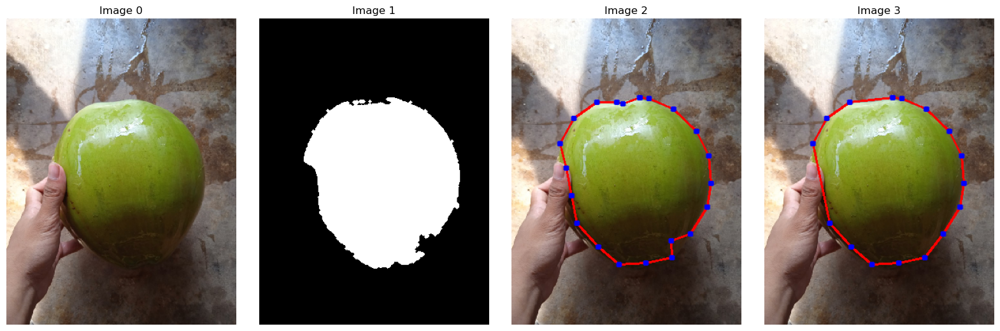

In [121]:
image_output1, XPoints, YPoints = GetPointsLabelling(image_RGB, mask3, nPoints = 20)
image_output2, NewXPoints, NewYPoints = GetConvexHullPoints(image_RGB, XPoints, YPoints)
ShowImage([image_RGB, mask3, image_output1, image_output2], 1, 4)